# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [4]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [5]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [6]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [7]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [8]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [9]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [10]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [28]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)
    
    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)

    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = 1/len(gradient) * torch.dot((gradient_norm-1),(gradient_norm-1))
    #### END CODE HERE ####
    return penalty


In [29]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [44]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = - torch.mean(crit_fake_pred)
    #### END CODE HERE ####
    return gen_loss

In [45]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [48]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = -torch.mean(crit_real_pred) + torch.mean(crit_fake_pred) + c_lambda * gp
    #### END CODE HERE ####
    return crit_loss

In [49]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Step 50: Generator loss: -0.05920535960933194, critic loss: 1.7905749062895773


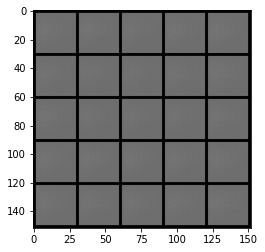

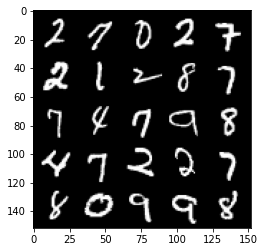

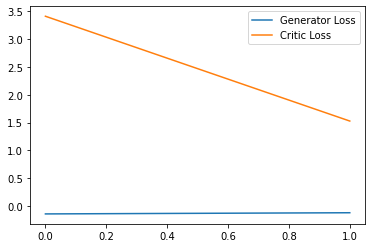

Step 100: Generator loss: 1.204593621119857, critic loss: -2.3138234884142874


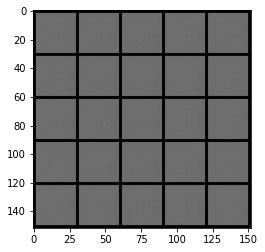

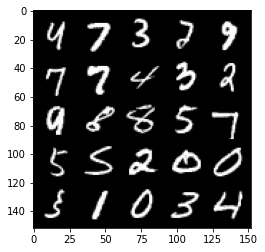

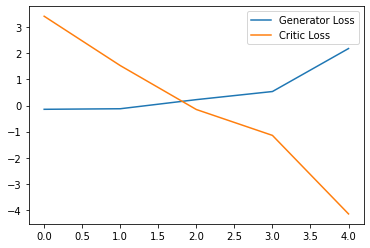

Step 150: Generator loss: 1.7803537947684527, critic loss: -11.63114553833008


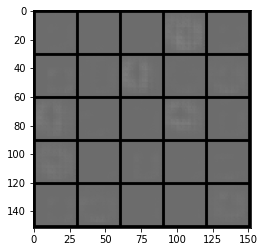

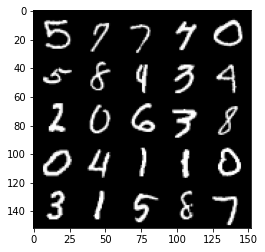

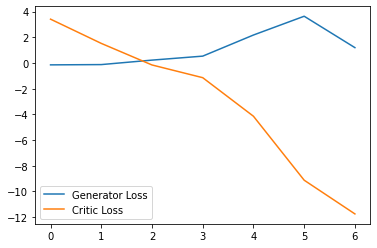

Step 200: Generator loss: -1.7129494643211365, critic loss: -28.38304249191284


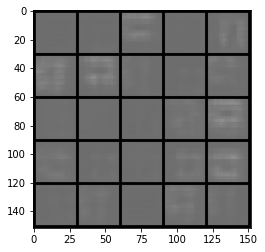

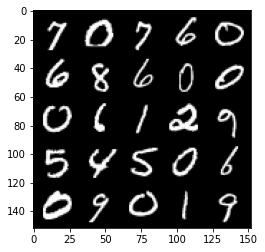

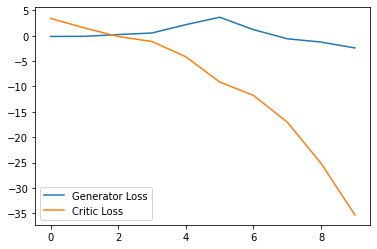

Step 250: Generator loss: -5.022749528884888, critic loss: -59.85496049499513


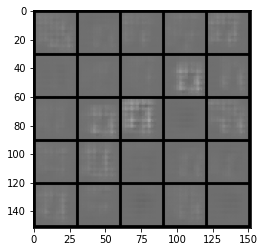

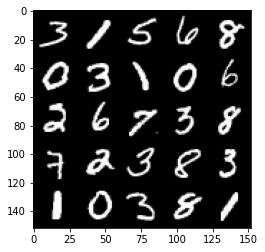

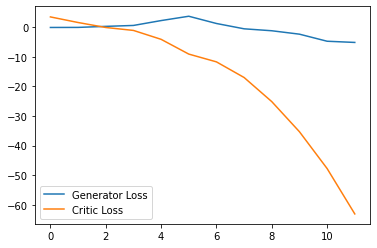

Step 300: Generator loss: -4.326667795181274, critic loss: -104.37567037963866


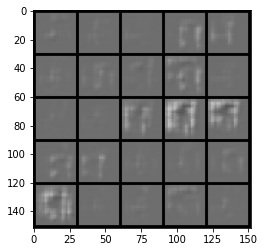

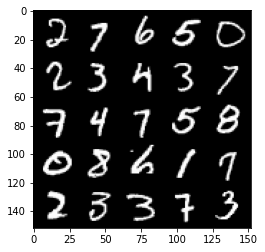

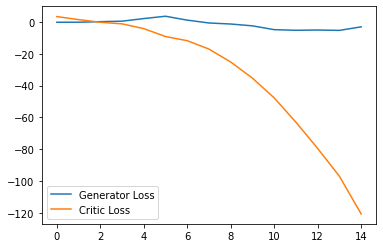

Step 350: Generator loss: -10.545005974769593, critic loss: -136.3406547317505


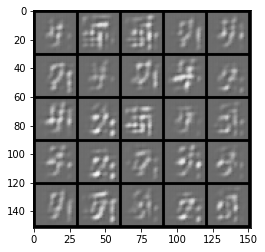

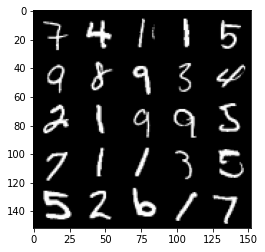

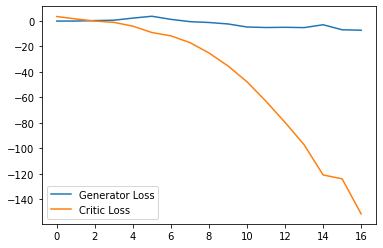

Step 400: Generator loss: 1.1888958293199539, critic loss: -193.28706936645503


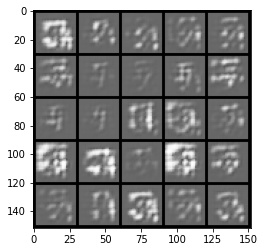

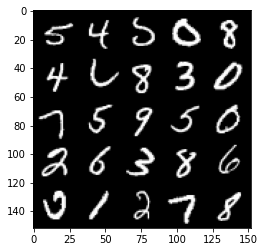

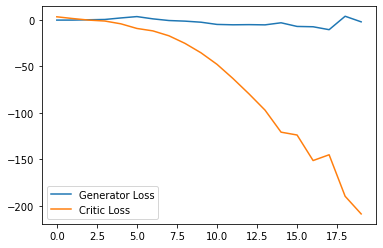

Step 450: Generator loss: -16.891376955509187, critic loss: -177.51165187072746


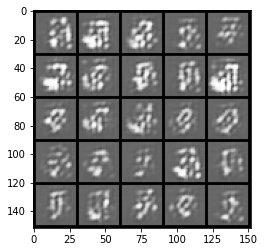

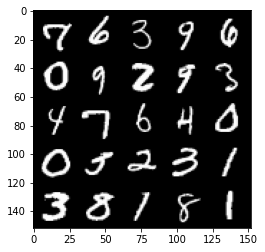

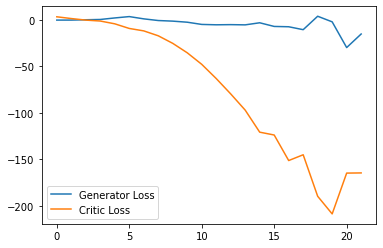

Step 500: Generator loss: -14.254000651836396, critic loss: -179.82452731323238


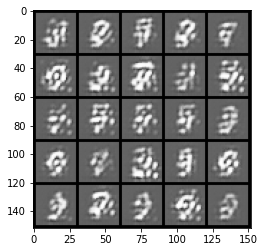

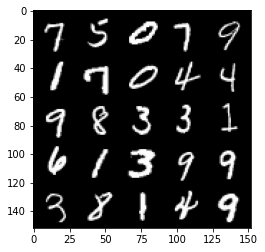

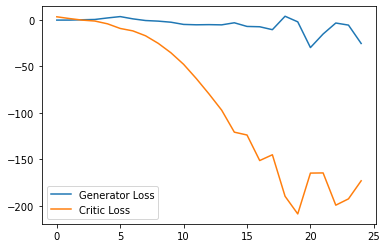

Step 550: Generator loss: 8.03965857744217, critic loss: -261.3363417663574


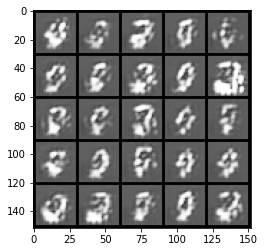

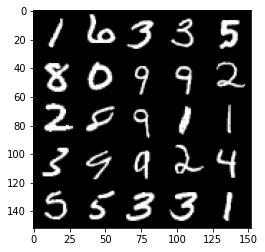

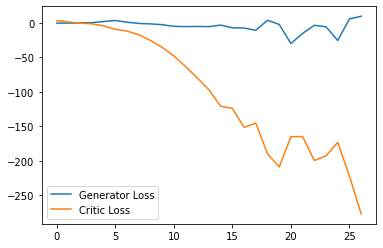

Step 600: Generator loss: 5.609347412586212, critic loss: -297.4203463439941


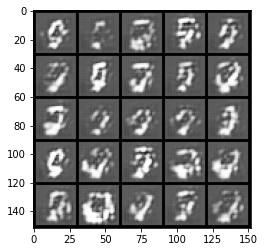

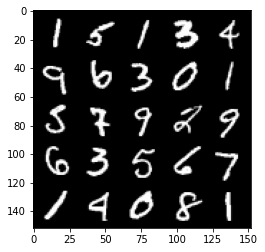

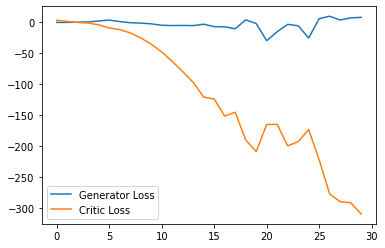

Step 650: Generator loss: -18.705310498476027, critic loss: -252.86522279357916


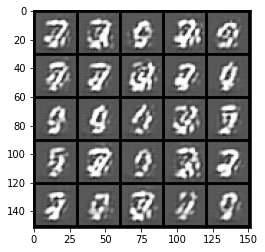

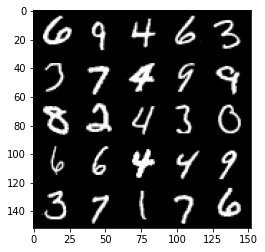

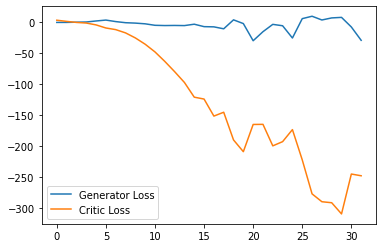

Step 700: Generator loss: -5.083006867170334, critic loss: -255.1093642883301


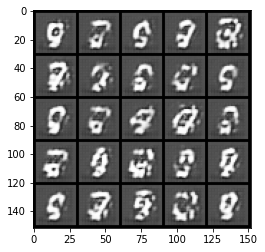

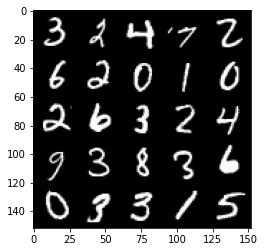

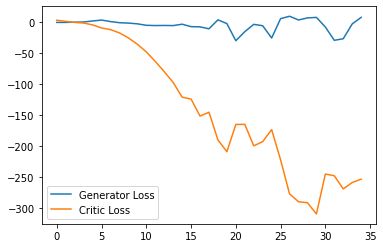

Step 750: Generator loss: -16.155912363529204, critic loss: -224.73201148986823


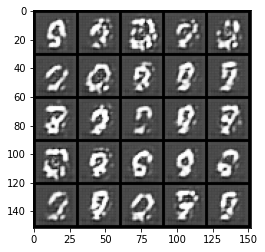

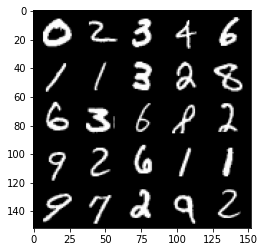

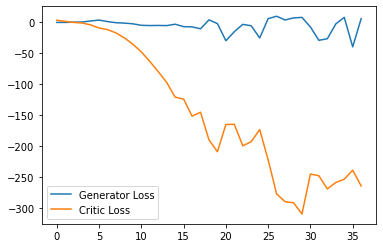

Step 800: Generator loss: -48.4469341135025, critic loss: -176.6091745147705


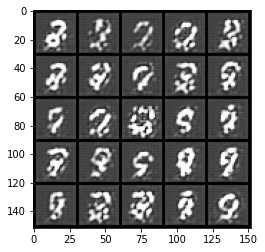

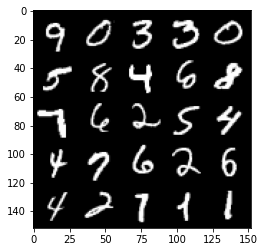

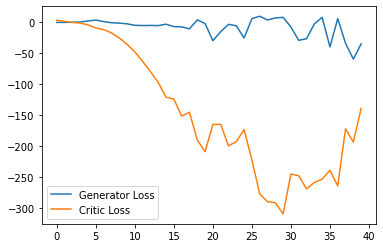

Step 850: Generator loss: -25.226094088554383, critic loss: -192.10386705017095


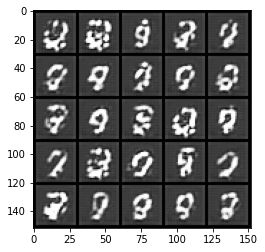

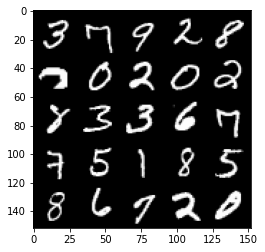

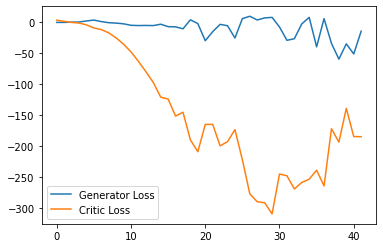

Step 900: Generator loss: -17.38306564807892, critic loss: -121.05025054550171


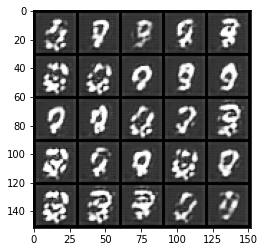

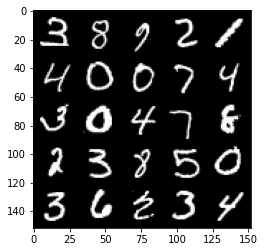

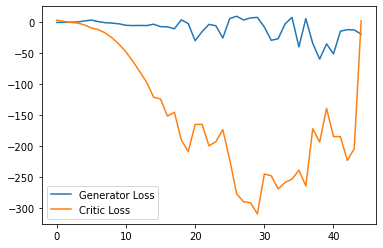

Step 950: Generator loss: -36.28496705055237, critic loss: -113.85466069793704


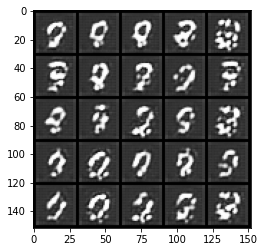

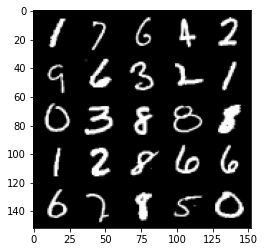

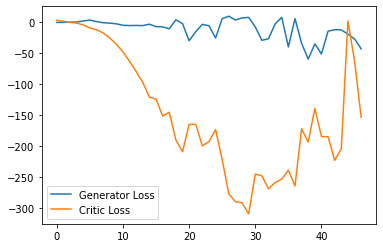

Step 1000: Generator loss: -37.35426974773407, critic loss: -153.88151292419437


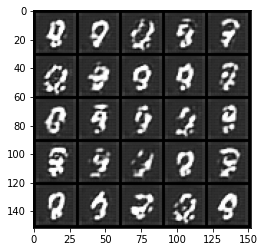

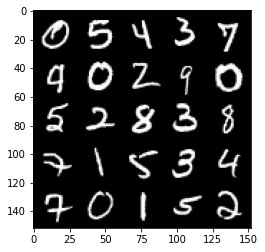

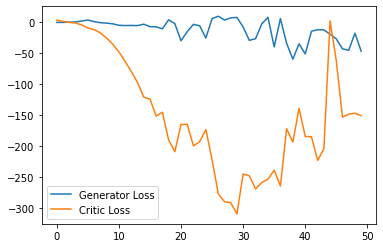

Step 1050: Generator loss: 0.9414178645610809, critic loss: -16.47213941955566


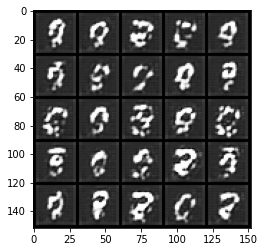

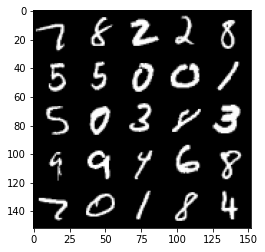

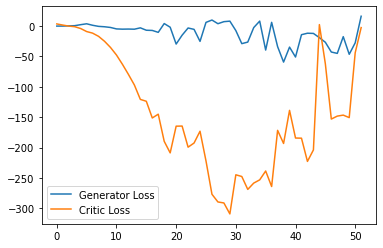

Step 1100: Generator loss: -31.07129081249237, critic loss: -94.058145362854


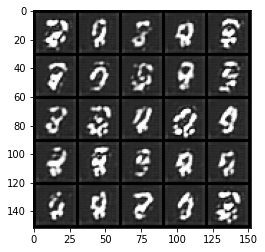

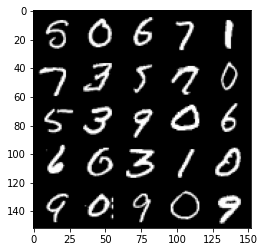

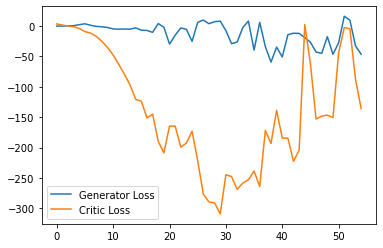

Step 1150: Generator loss: -34.17546741604805, critic loss: -64.78386908721924


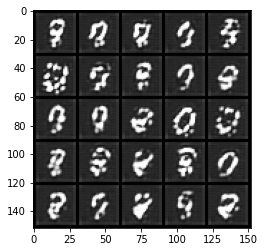

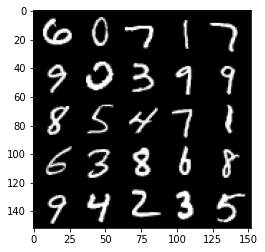

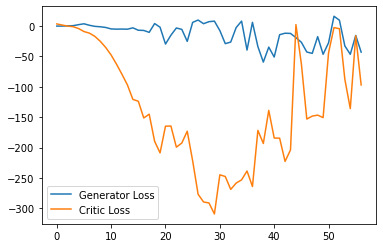

Step 1200: Generator loss: -38.74093381166458, critic loss: -99.71415483093261


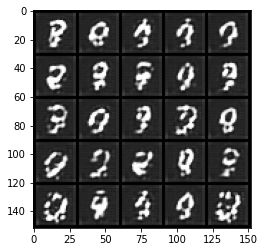

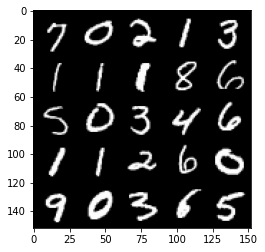

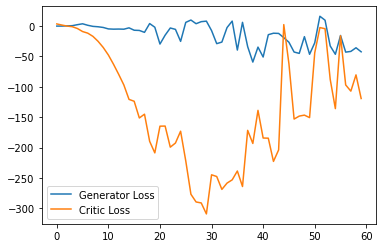

Step 1250: Generator loss: 2.0159355545043947, critic loss: 33.56827036094667


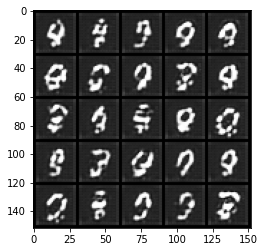

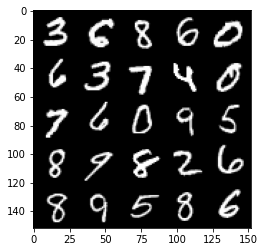

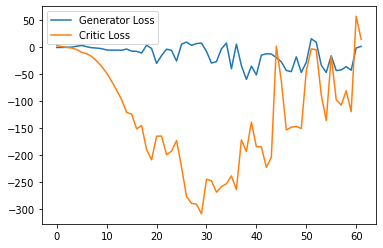

Step 1300: Generator loss: 1.2627792710065842, critic loss: 19.800044555664055


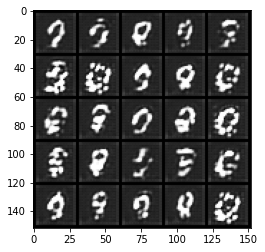

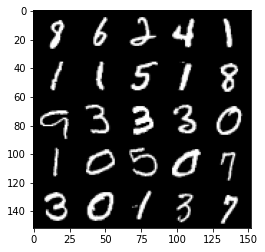

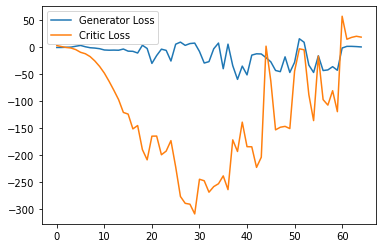

Step 1350: Generator loss: -0.4510326145589352, critic loss: 19.996671247482304


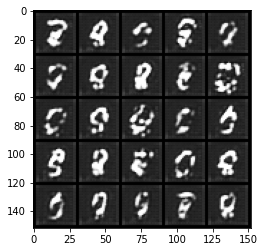

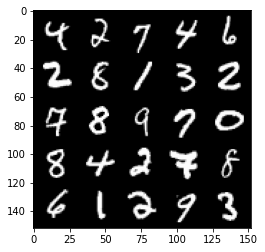

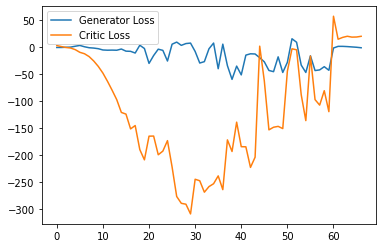

Step 1400: Generator loss: -3.4432313895225524, critic loss: 21.34300415039063


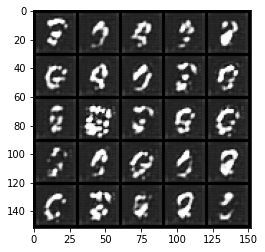

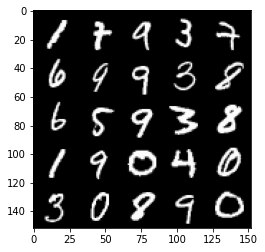

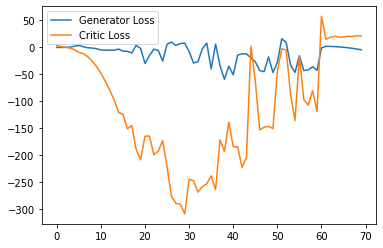

Step 1450: Generator loss: -6.925688161849975, critic loss: 22.705920330047608


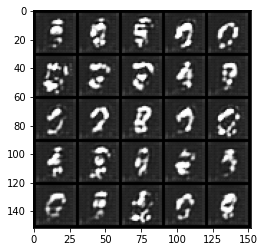

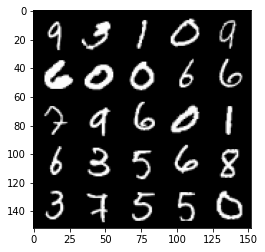

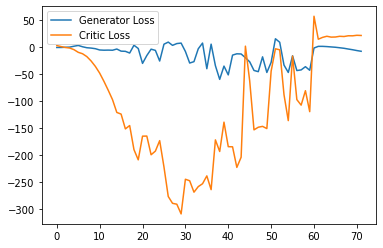

Step 1500: Generator loss: -10.384886589050293, critic loss: 24.70615785217286


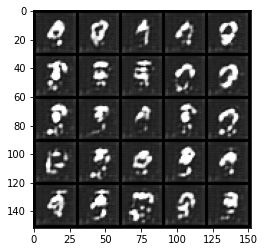

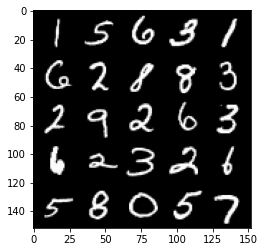

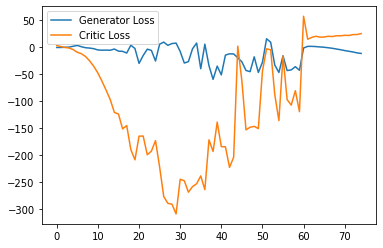

Step 1550: Generator loss: -14.612900657653809, critic loss: 21.403287048339845


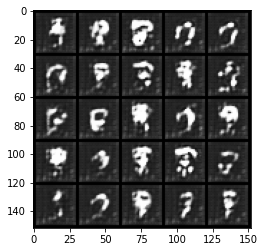

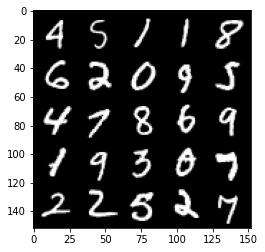

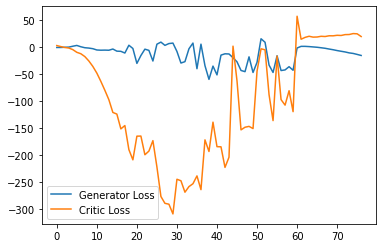

Step 1600: Generator loss: -18.820101013183592, critic loss: 13.914477394104004


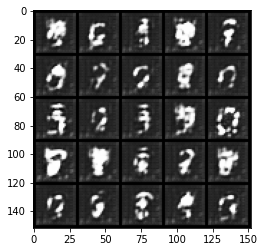

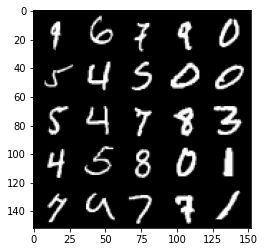

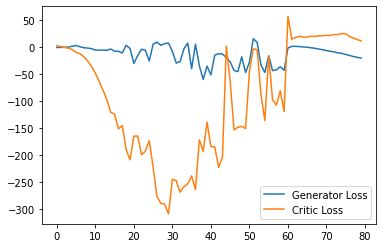

Step 1650: Generator loss: -21.26263114929199, critic loss: 8.889747446060179


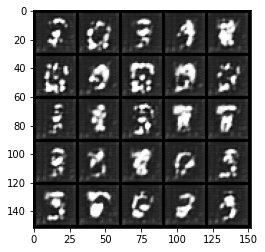

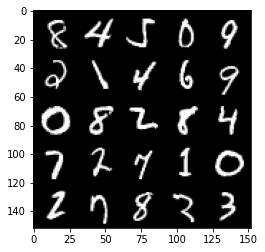

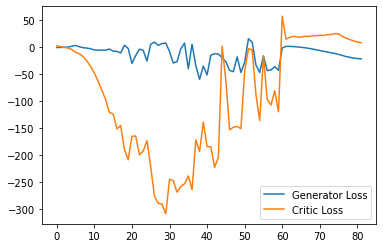

Step 1700: Generator loss: -22.869928436279295, critic loss: 6.272609733581543


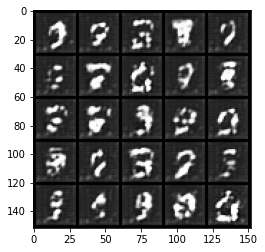

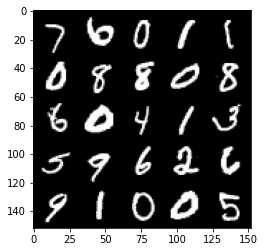

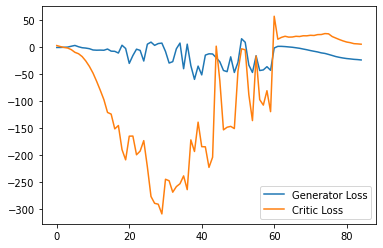

Step 1750: Generator loss: -23.79136100769043, critic loss: 4.0915091714859


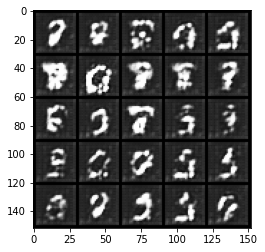

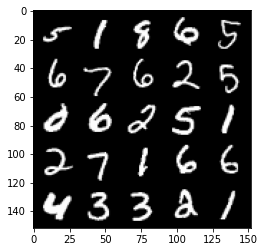

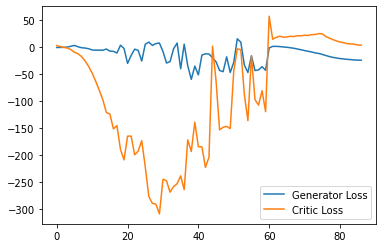

Step 1800: Generator loss: -24.683926010131835, critic loss: 2.072547869682312


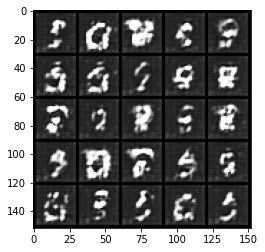

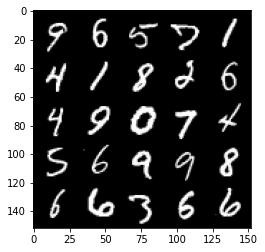

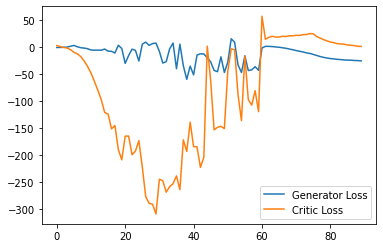

Step 1850: Generator loss: -24.830532722473144, critic loss: 0.46897825336456306


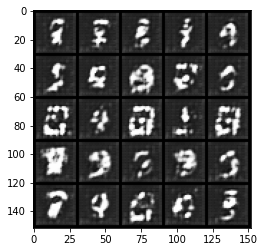

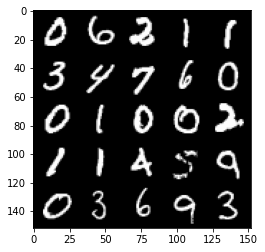

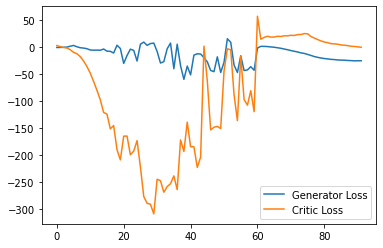

Step 1900: Generator loss: -24.94125244140625, critic loss: -0.548956537246704


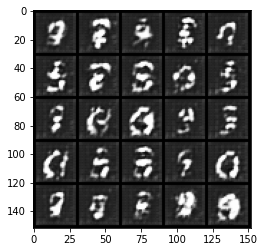

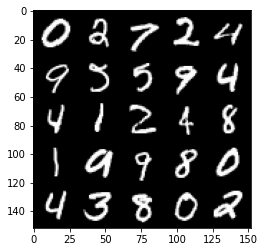

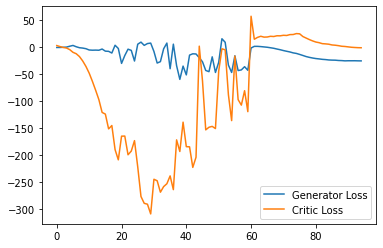

Step 1950: Generator loss: -25.566077003479005, critic loss: -1.3808723335266115


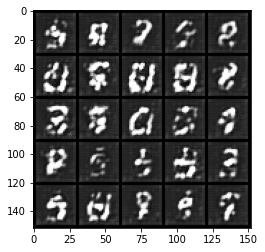

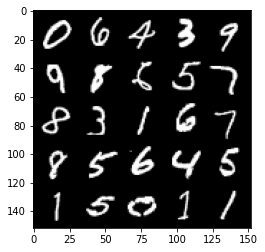

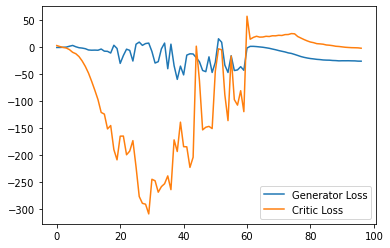

Step 2000: Generator loss: -25.055153999328613, critic loss: -3.571165028572082


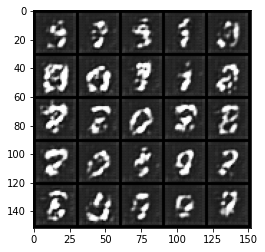

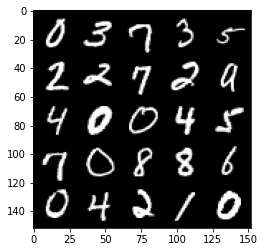

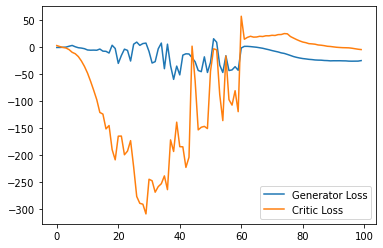

Step 2050: Generator loss: -23.867247924804687, critic loss: -5.484823461532592


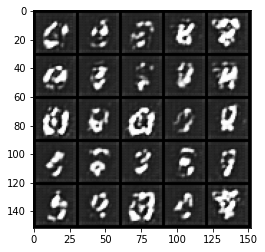

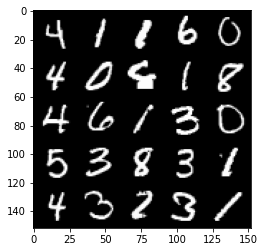

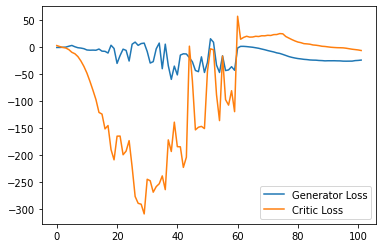

Step 2100: Generator loss: -23.50990951538086, critic loss: -7.538717031478883


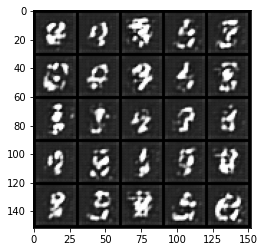

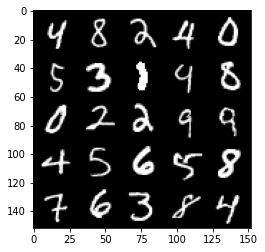

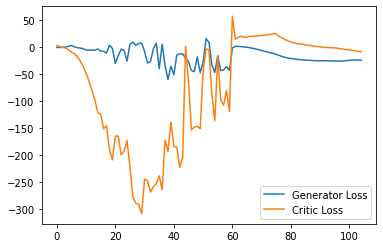

Step 2150: Generator loss: -23.75600788116455, critic loss: -9.418716577529906


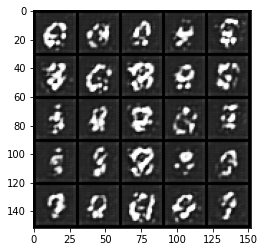

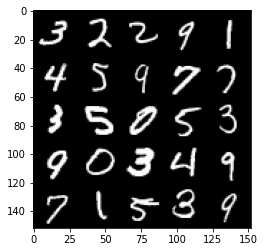

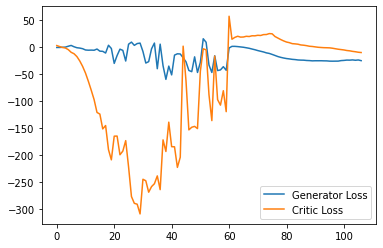

Step 2200: Generator loss: -22.522949180603028, critic loss: -11.827882793426513


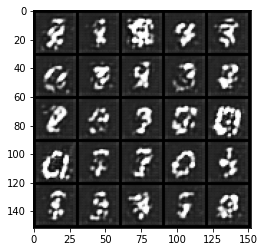

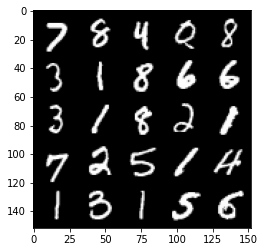

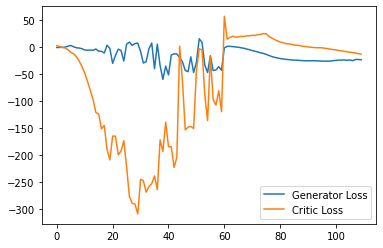

Step 2250: Generator loss: -21.343887214660644, critic loss: -13.184300395965574


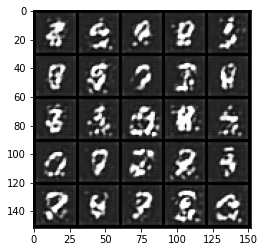

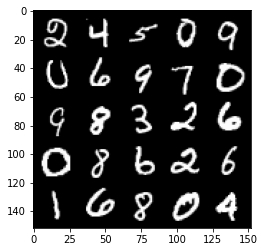

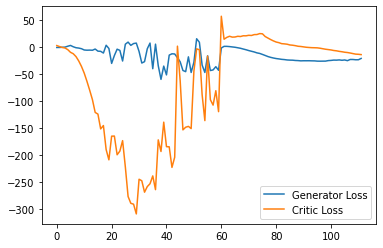

Step 2300: Generator loss: -18.520087852478028, critic loss: -14.659596170425411


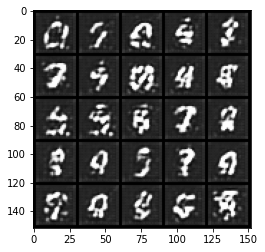

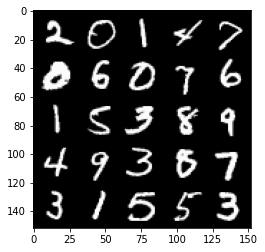

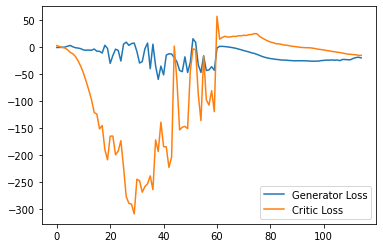

Step 2350: Generator loss: -18.54375503540039, critic loss: -17.20673184204102


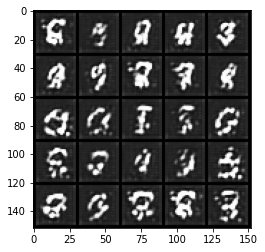

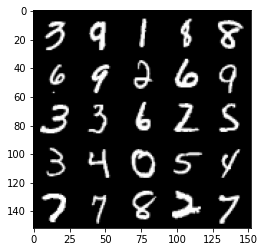

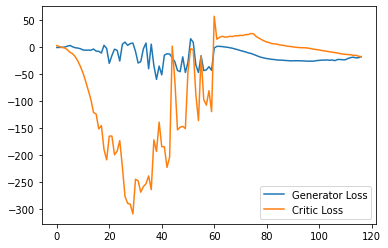

Step 2400: Generator loss: -16.497441787719726, critic loss: -18.588391962051393


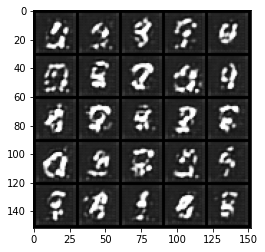

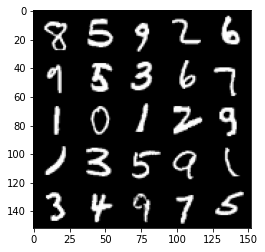

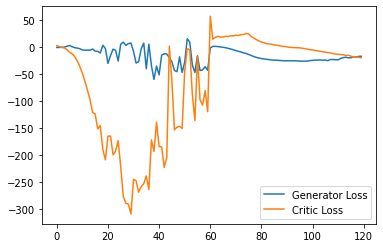

Step 2450: Generator loss: -15.27962574005127, critic loss: -16.676039319992064


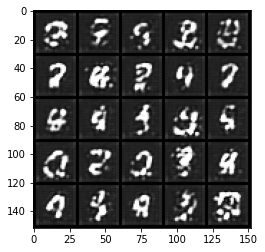

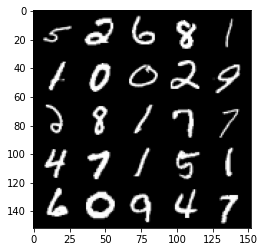

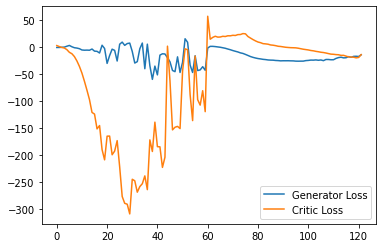

Step 2500: Generator loss: -12.282542734146118, critic loss: -20.080294261932373


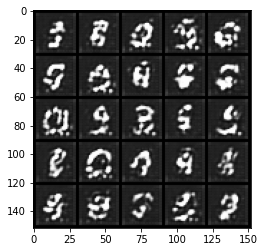

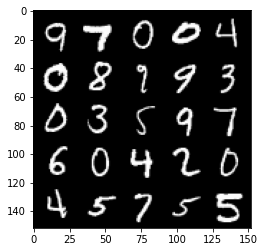

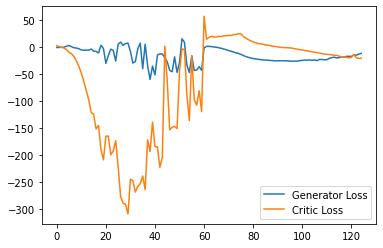

Step 2550: Generator loss: -11.70657141327858, critic loss: -15.261763382911681


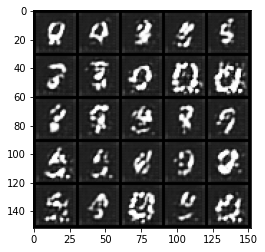

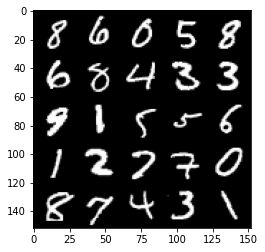

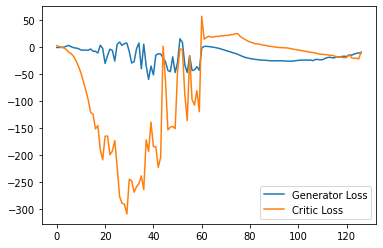

Step 2600: Generator loss: -12.488604181110858, critic loss: -17.214967706680298


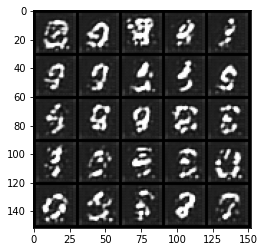

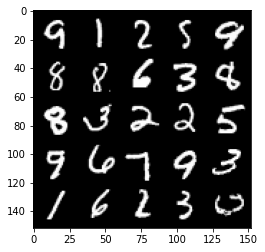

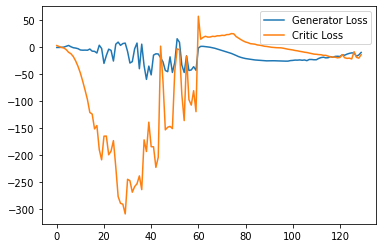

Step 2650: Generator loss: -10.134684904813767, critic loss: -22.546780239105225


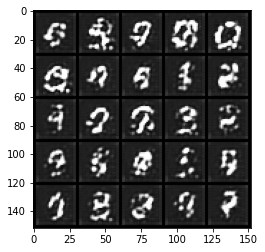

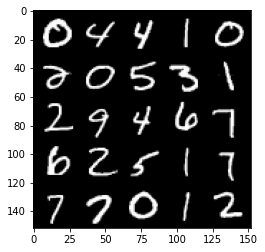

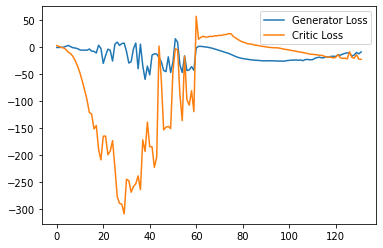

Step 2700: Generator loss: -6.899996612668037, critic loss: -16.228210616111756


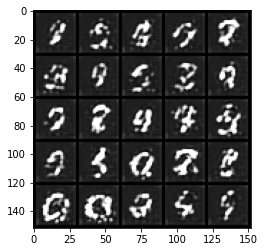

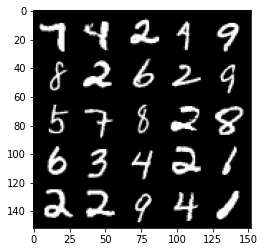

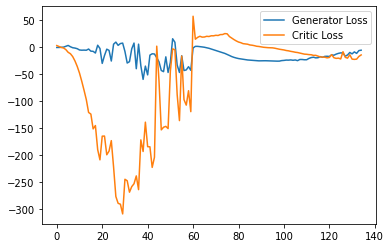

Step 2750: Generator loss: -8.574231307506562, critic loss: -22.587841995239256


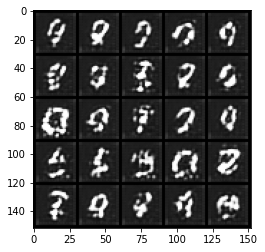

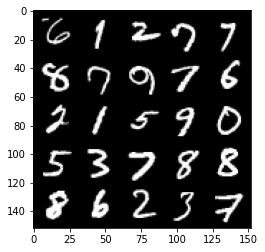

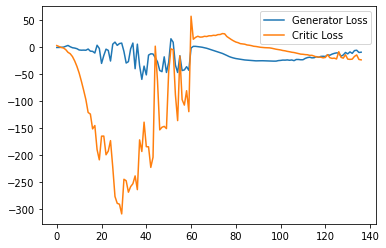

Step 2800: Generator loss: -4.276828202605247, critic loss: -23.054184358596807


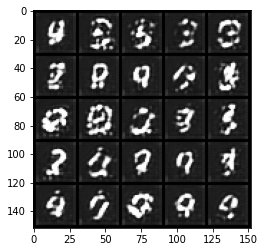

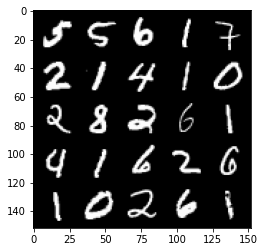

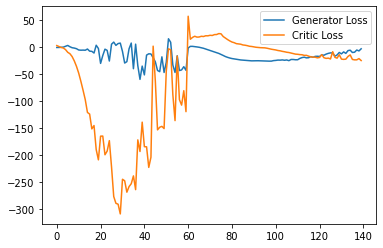

Step 2850: Generator loss: -1.3992068222165108, critic loss: -13.00586731052399


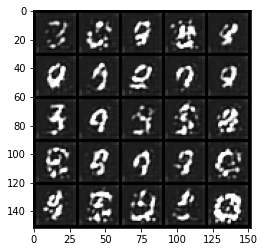

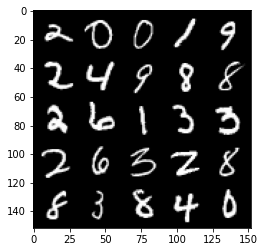

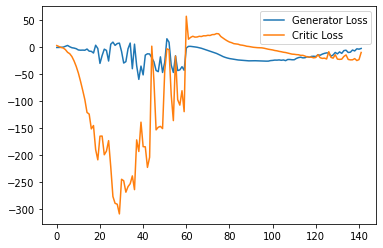

Step 2900: Generator loss: -4.877451629340649, critic loss: -20.580734882354733


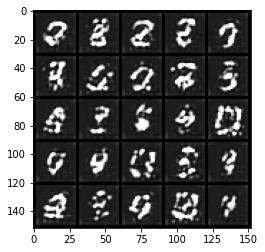

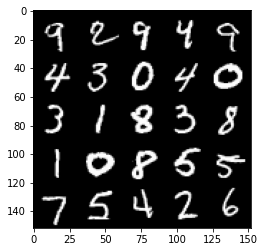

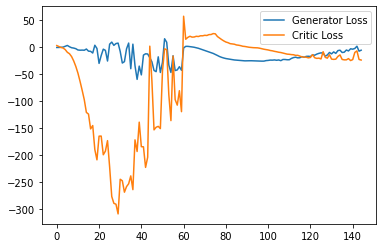

Step 2950: Generator loss: -4.6368180367350575, critic loss: -23.62664990043639


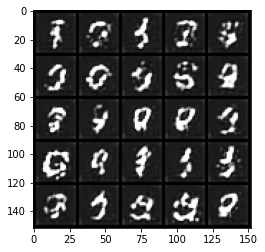

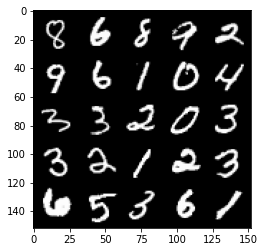

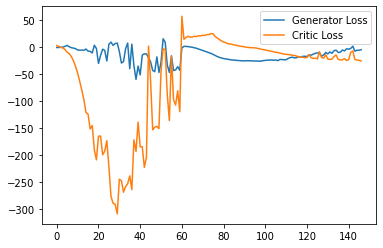

Step 3000: Generator loss: -3.0662036204338072, critic loss: -20.87996397399902


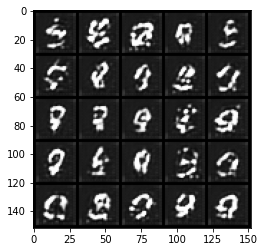

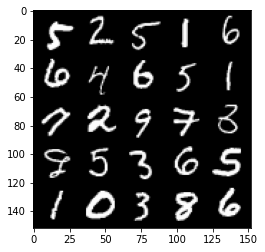

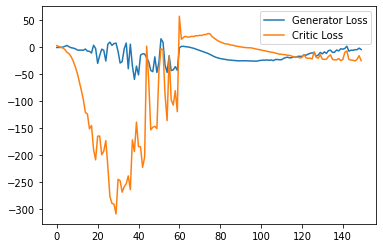

Step 3050: Generator loss: -1.2631136000156402, critic loss: -21.835016803741453


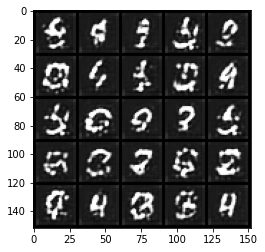

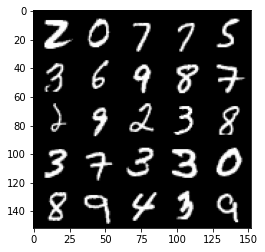

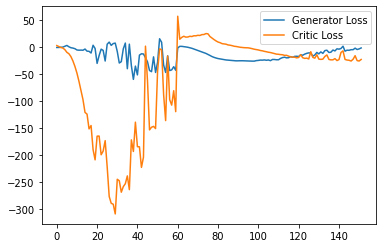

Step 3100: Generator loss: -3.076461801081896, critic loss: -24.194336446762076


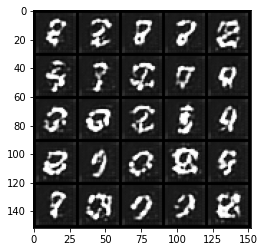

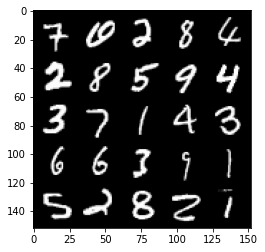

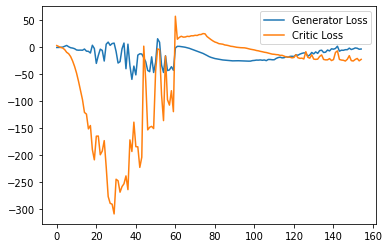

Step 3150: Generator loss: -4.202099351882935, critic loss: -18.102606528282166


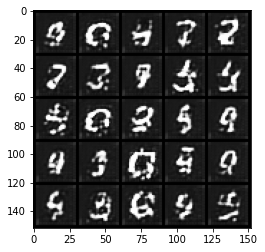

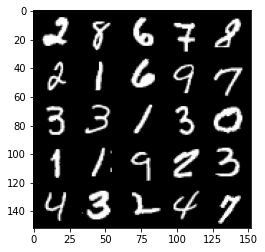

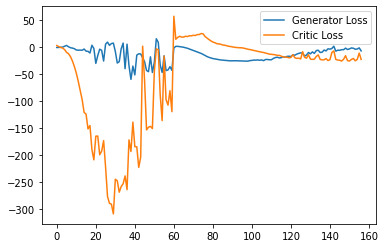

Step 3200: Generator loss: -5.795509902238845, critic loss: -22.83191098022461


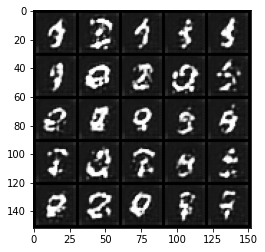

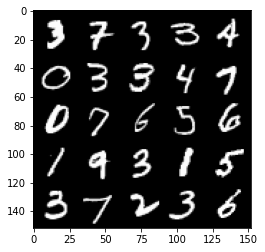

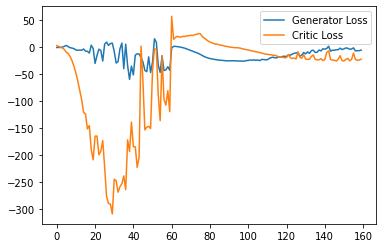

Step 3250: Generator loss: 0.2846673008799553, critic loss: -4.174512986660004


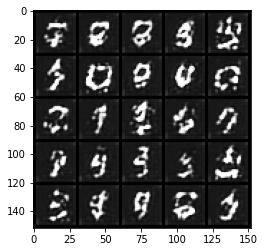

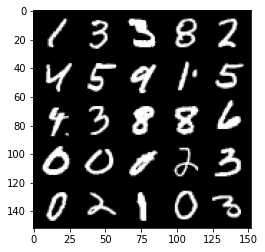

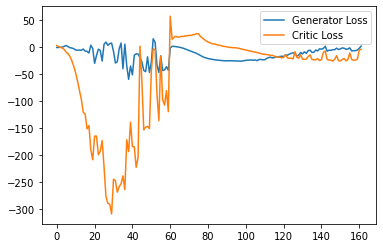

Step 3300: Generator loss: -5.484541981369257, critic loss: -17.70951776885986


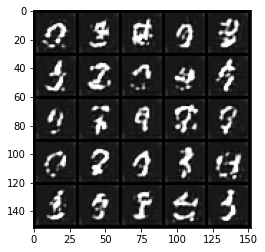

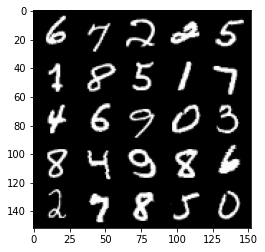

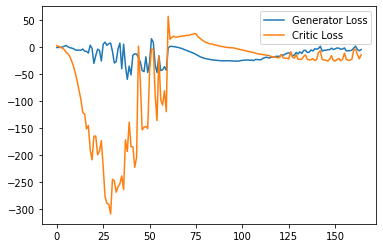

Step 3350: Generator loss: -4.6199693743884565, critic loss: -15.130972970962528


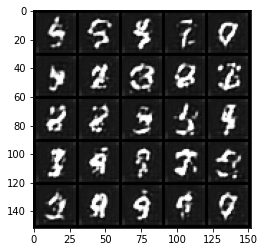

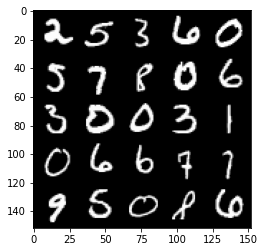

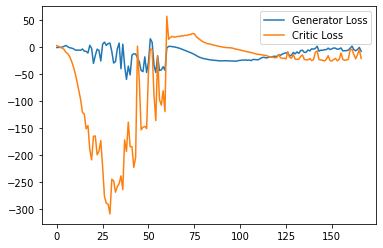

Step 3400: Generator loss: -4.404901915788651, critic loss: -16.18887839603424


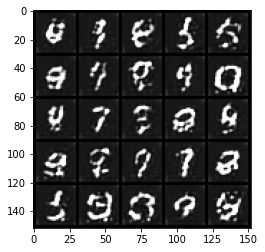

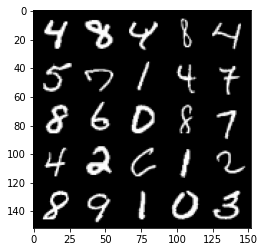

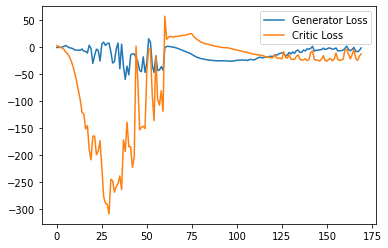

Step 3450: Generator loss: -6.83115636408329, critic loss: -21.160672871589657


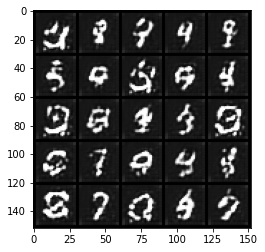

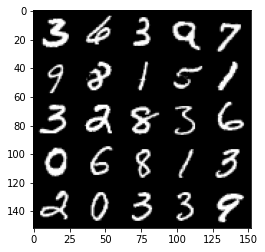

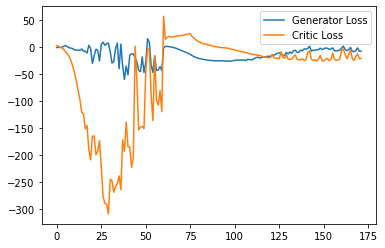

Step 3500: Generator loss: -4.003035068511963, critic loss: -16.337913383960725


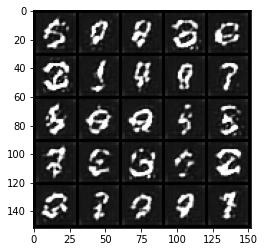

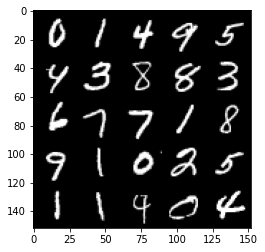

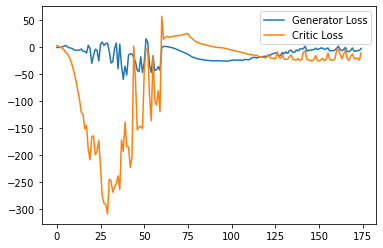

Step 3550: Generator loss: -0.6899223265051841, critic loss: -2.4810186624526973


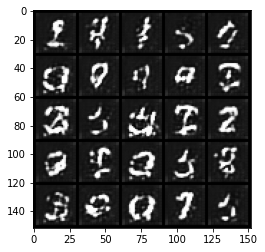

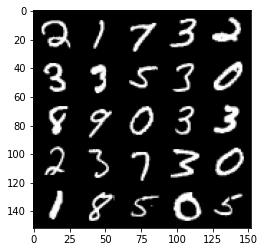

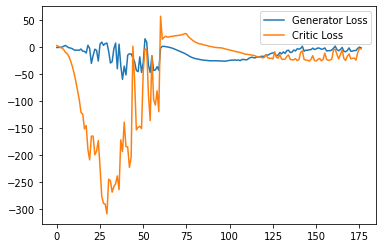

Step 3600: Generator loss: -8.132344490289688, critic loss: -14.601022836685175


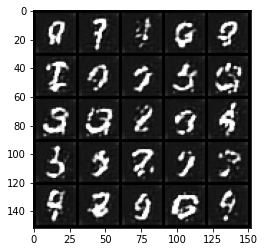

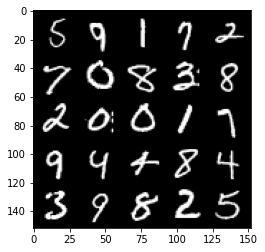

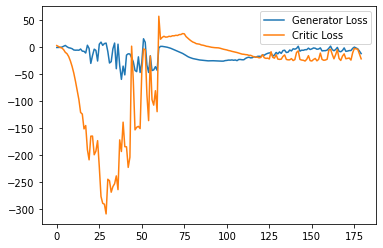

Step 3650: Generator loss: -5.51405452132225, critic loss: -12.899350463867192


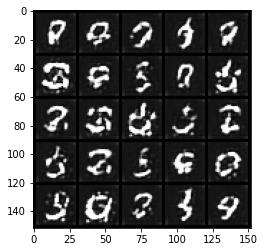

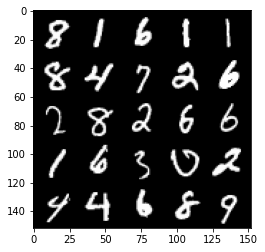

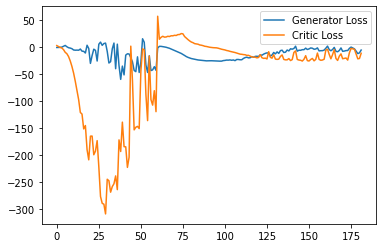

Step 3700: Generator loss: -6.38553021132946, critic loss: -16.640602882862094


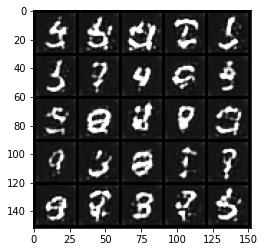

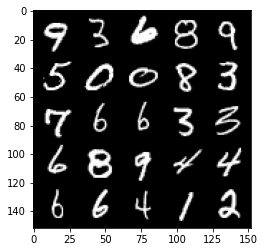

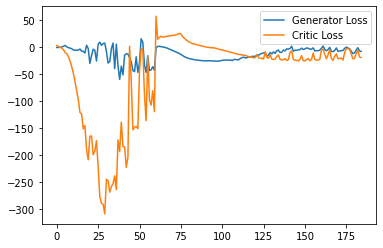

Step 3750: Generator loss: -8.268897032886743, critic loss: -20.320113232612613


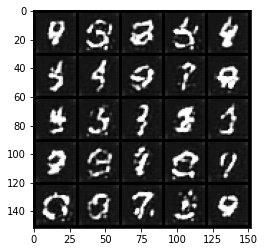

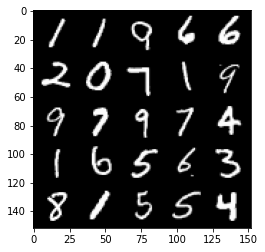

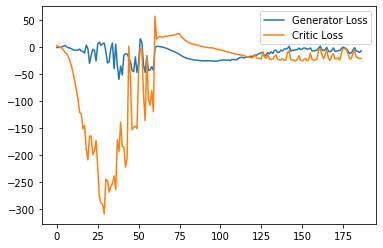

Step 3800: Generator loss: -3.453036136329174, critic loss: -6.050004327297214


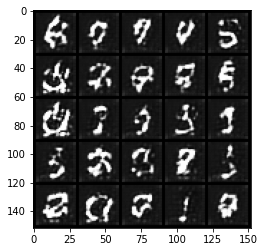

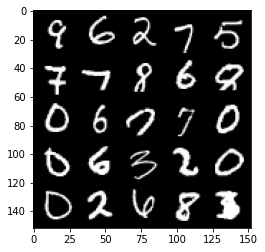

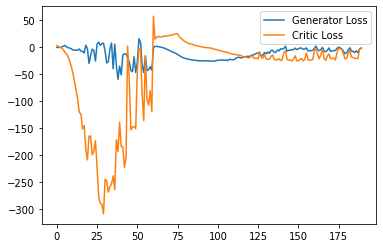

Step 3850: Generator loss: -4.928583631515503, critic loss: -2.944996697902679


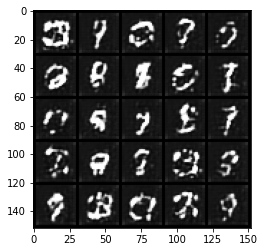

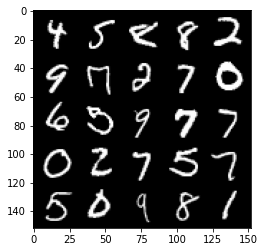

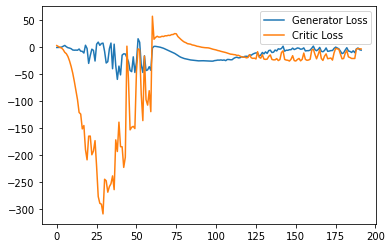

Step 3900: Generator loss: -9.367803719043732, critic loss: -15.626720354080199


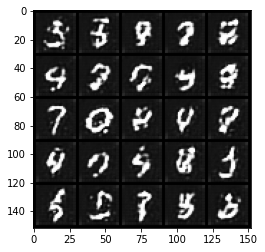

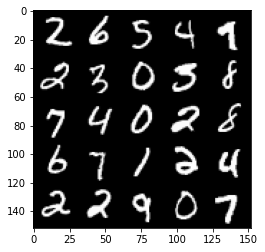

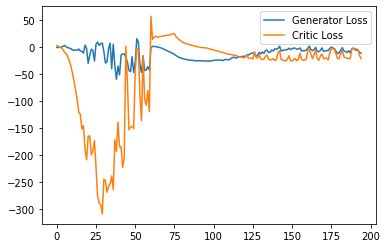

Step 3950: Generator loss: -5.949218647480011, critic loss: -18.69422129631042


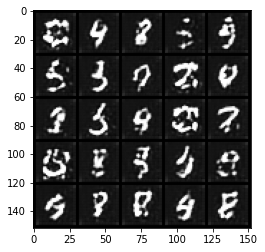

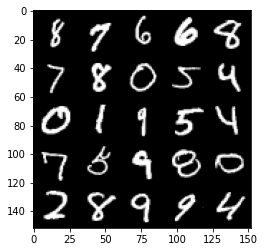

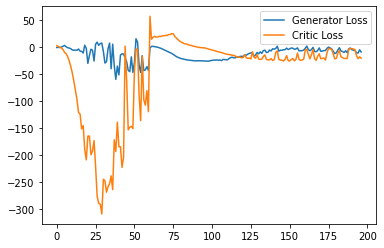

Step 4000: Generator loss: -6.834580436944962, critic loss: -19.316791790008544


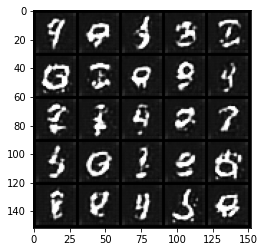

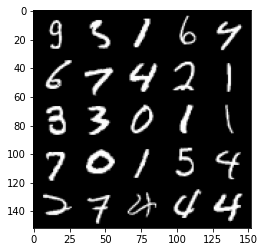

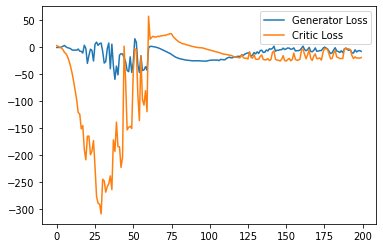

Step 4050: Generator loss: -4.584304372668266, critic loss: -14.083801323890684


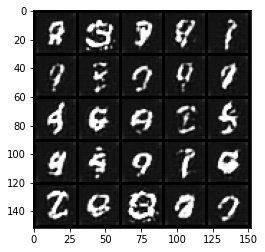

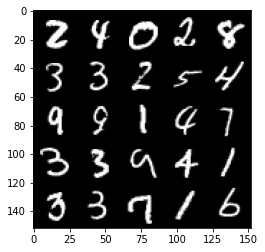

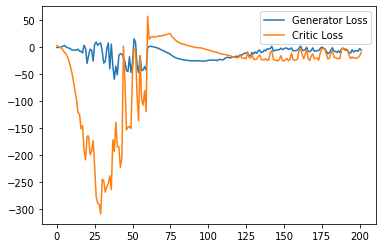

Step 4100: Generator loss: -7.169545420408249, critic loss: -23.403865481376656


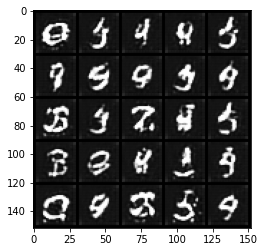

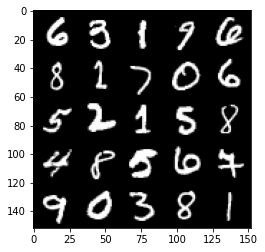

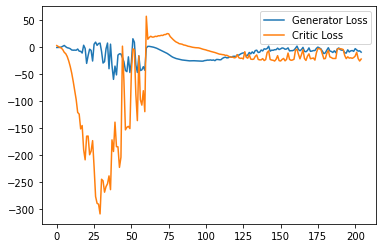

Step 4150: Generator loss: 3.035042099952698, critic loss: 1.2207233939170825


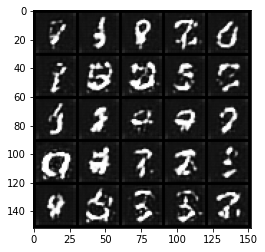

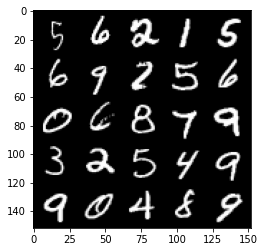

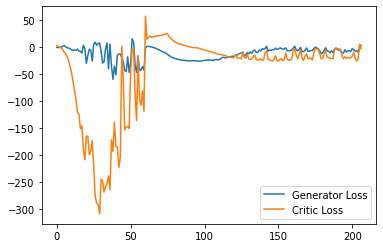

Step 4200: Generator loss: -1.1165821757912635, critic loss: -2.7809736289978026


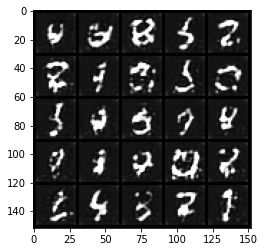

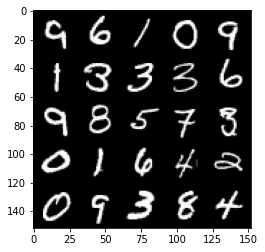

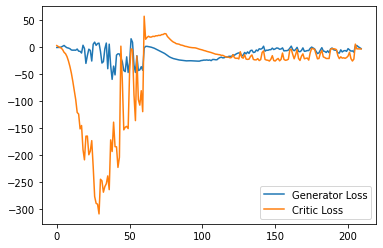

Step 4250: Generator loss: -3.8183925628662108, critic loss: -3.6214826431274405


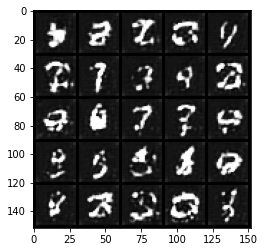

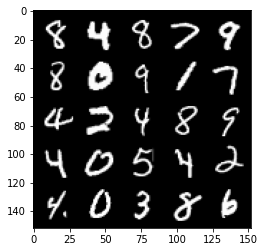

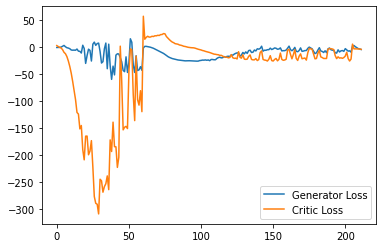

Step 4300: Generator loss: -10.102569198608398, critic loss: -16.586322630882265


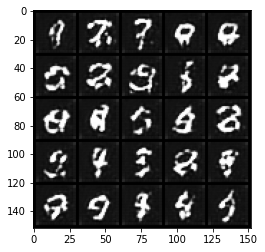

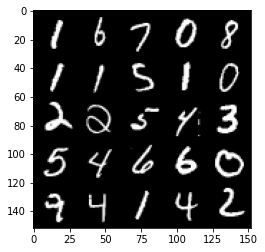

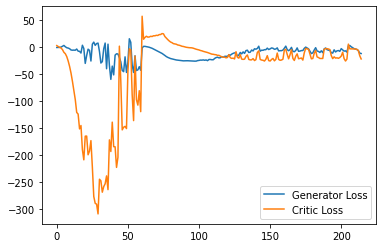

Step 4350: Generator loss: 0.696594075858593, critic loss: -0.14835468816757091


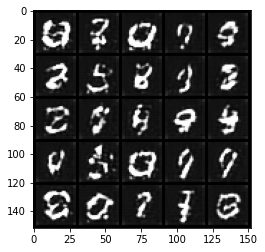

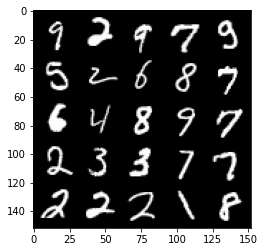

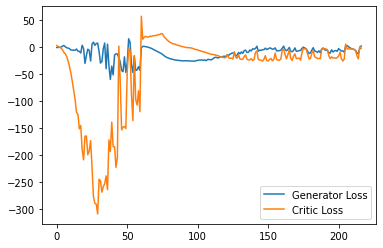

Step 4400: Generator loss: -1.8248544545471668, critic loss: -2.3336563482284545


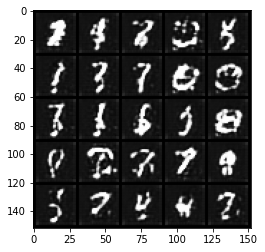

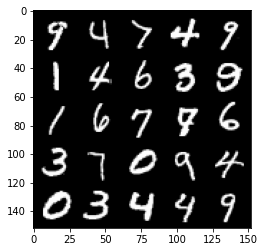

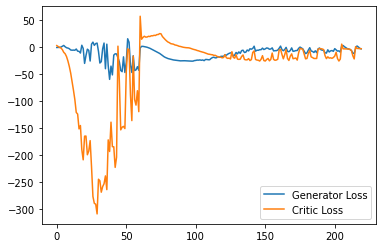

Step 4450: Generator loss: -3.859286222457886, critic loss: -2.6837656583786025


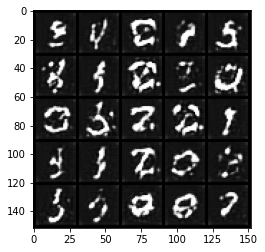

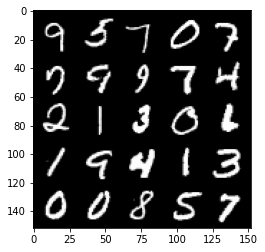

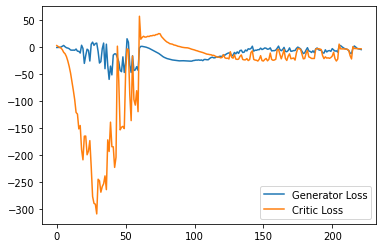

Step 4500: Generator loss: -5.158690156936646, critic loss: -2.958164036750793


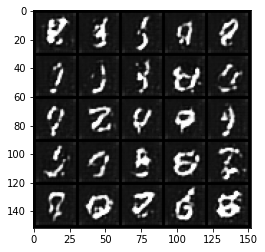

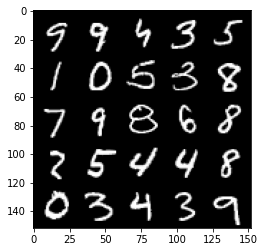

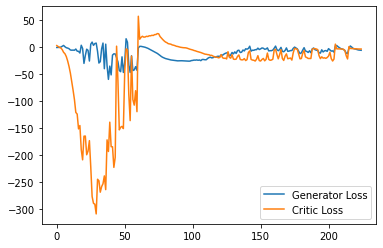

Step 4550: Generator loss: -5.197856283187866, critic loss: -3.5228070545196526


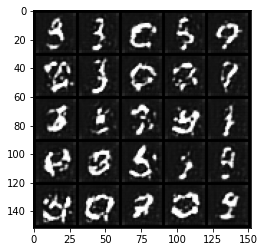

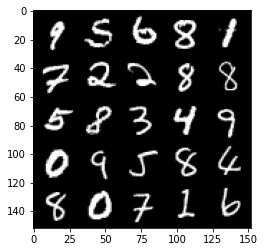

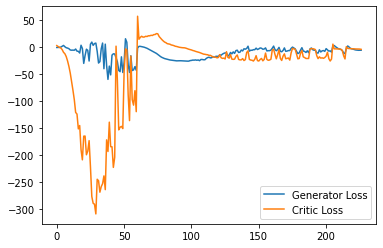

Step 4600: Generator loss: -7.516929564476013, critic loss: -5.947417788505553


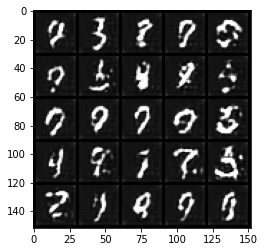

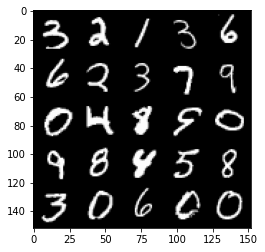

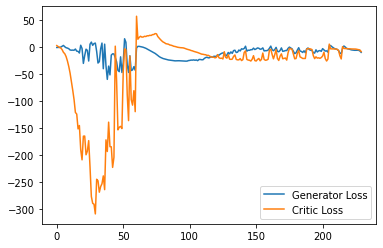

Step 4650: Generator loss: -11.480899200439453, critic loss: -16.8328382692337


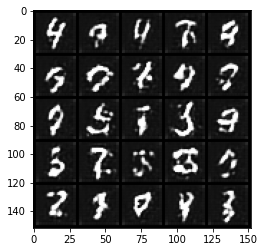

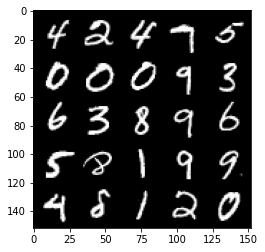

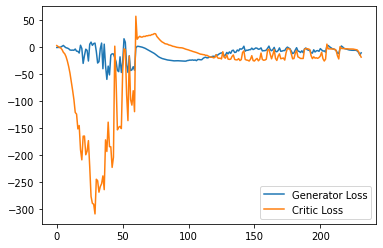

Step 4700: Generator loss: -0.09380633801221848, critic loss: -0.7113909673690803


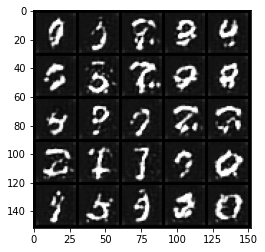

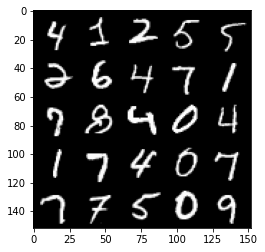

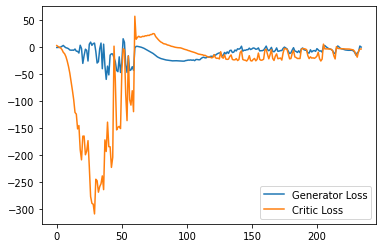

Step 4750: Generator loss: -3.1382190227508544, critic loss: -3.3352929382324223


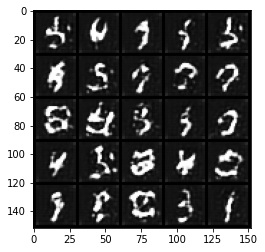

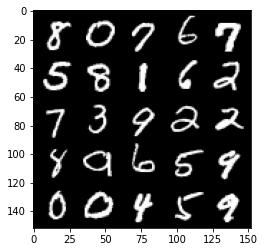

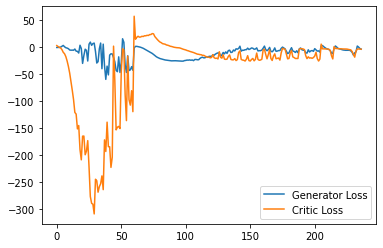

Step 4800: Generator loss: -8.191334804296494, critic loss: -7.128630525588992


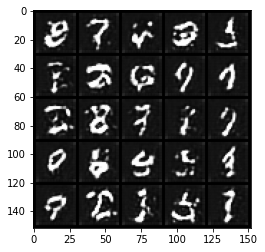

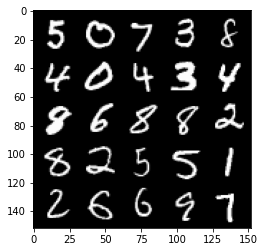

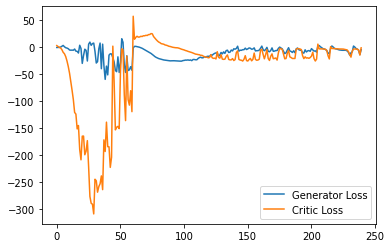

Step 4850: Generator loss: -3.0426366260647772, critic loss: -3.975037438392639


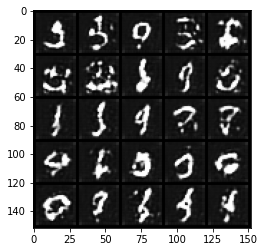

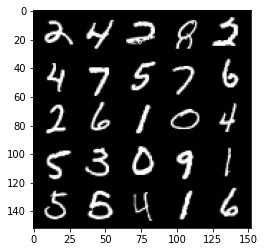

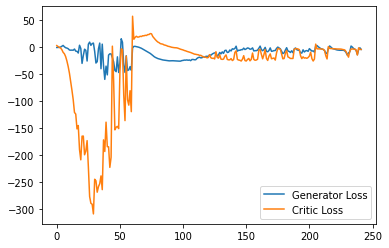

Step 4900: Generator loss: -10.648518319129943, critic loss: -17.751574922084806


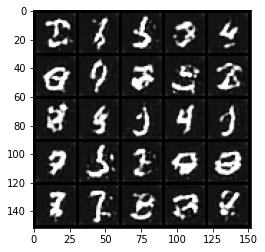

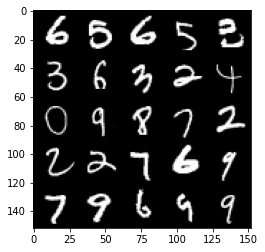

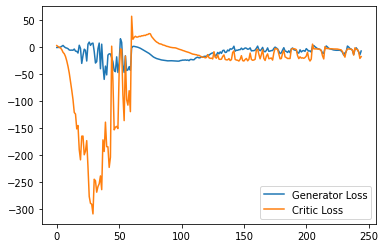

Step 4950: Generator loss: -8.095376132726669, critic loss: -14.915442622184756


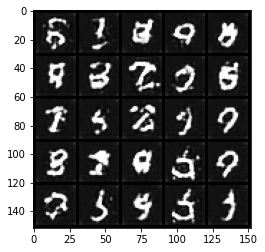

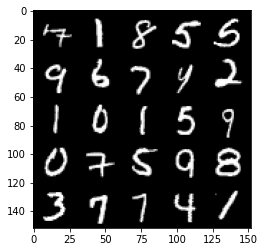

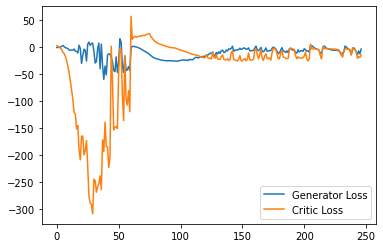

Step 5000: Generator loss: -10.599921083450317, critic loss: -21.44587747478485


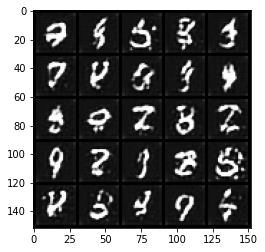

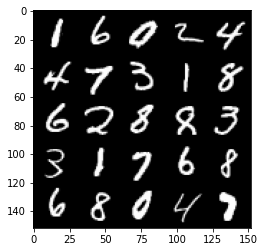

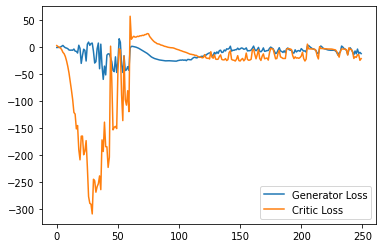

Step 5050: Generator loss: -7.783590961694717, critic loss: -16.6121916847229


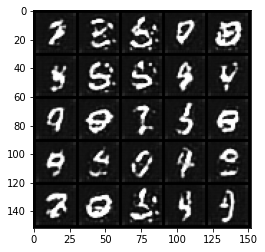

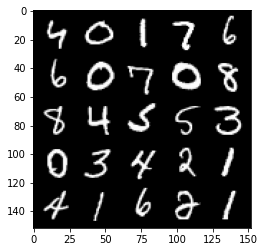

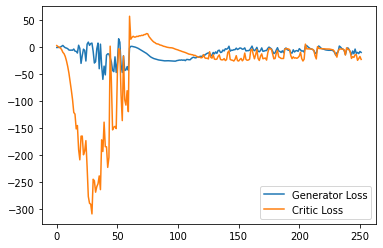

Step 5100: Generator loss: 1.222955447435379, critic loss: -3.7623192176818843


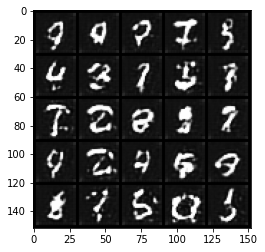

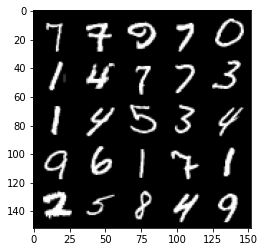

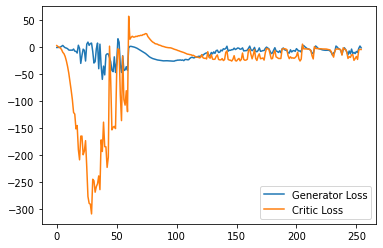

Step 5150: Generator loss: -6.137546262741089, critic loss: -6.225157076835632


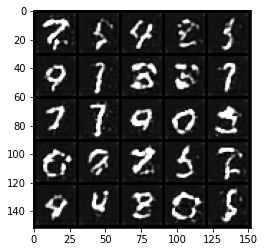

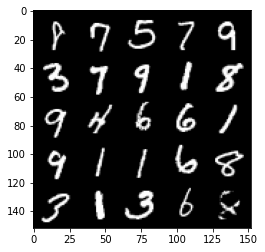

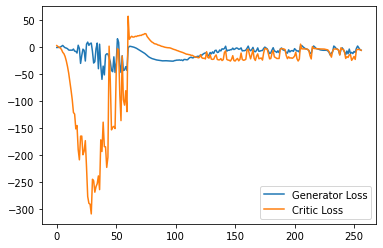

Step 5200: Generator loss: -12.009408876895904, critic loss: -16.73929568815231


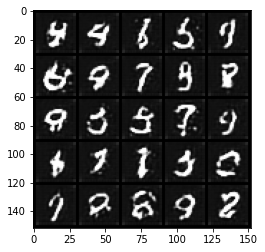

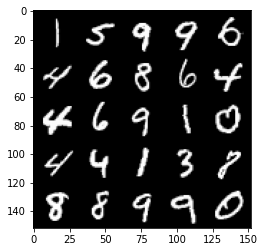

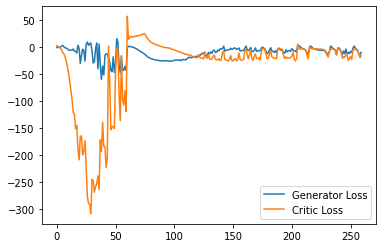

Step 5250: Generator loss: -12.019734748005867, critic loss: -16.276669214248656


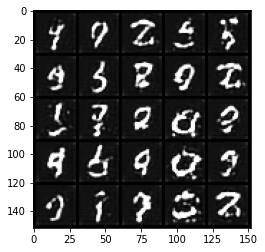

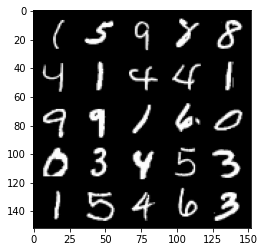

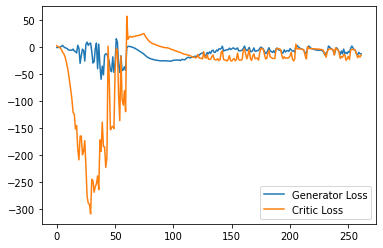

Step 5300: Generator loss: -6.580507398247719, critic loss: -9.589775764465328


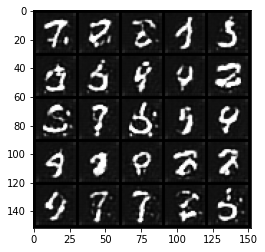

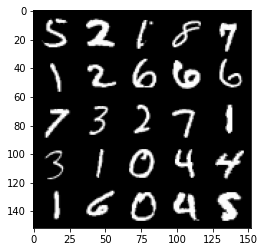

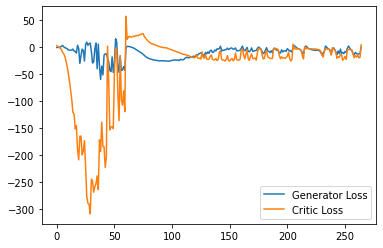

Step 5350: Generator loss: -1.640022408142686, critic loss: -3.2972253417968758


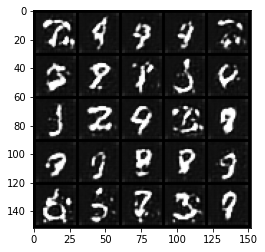

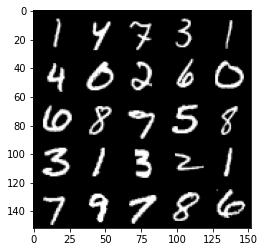

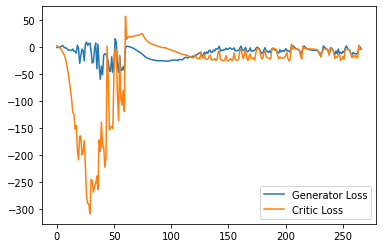

Step 5400: Generator loss: -6.152717542648316, critic loss: -3.7865780067443846


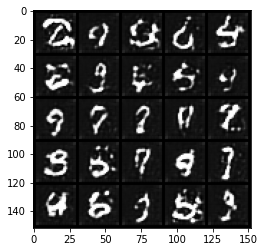

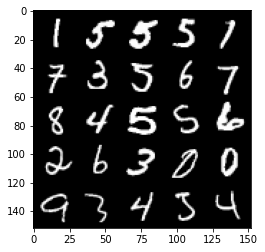

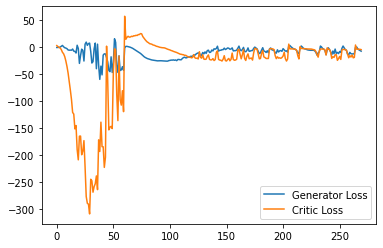

Step 5450: Generator loss: -11.694296159744262, critic loss: -13.552195850372316


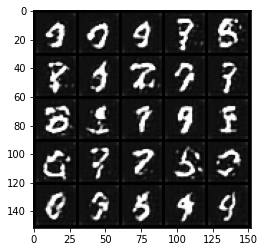

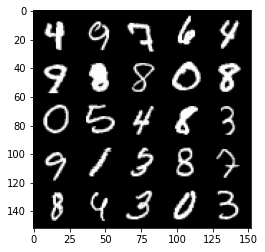

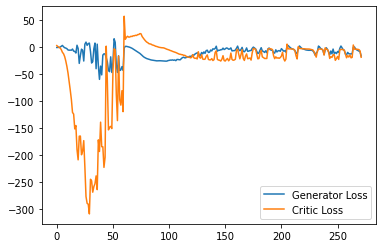

Step 5500: Generator loss: -8.846731662750244, critic loss: -16.07486677265167


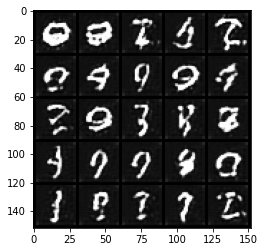

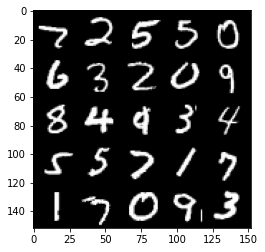

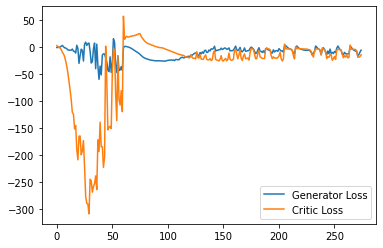

Step 5550: Generator loss: -11.453431492298842, critic loss: -13.052009287834169


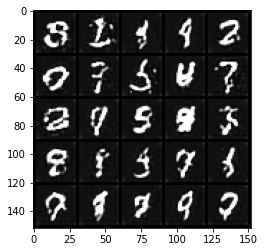

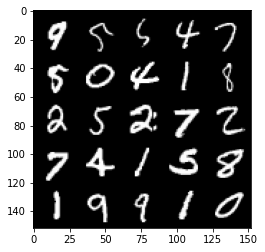

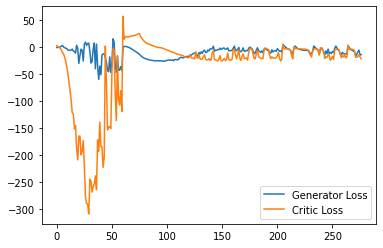

Step 5600: Generator loss: 0.32712134063243864, critic loss: -3.4433708820343014


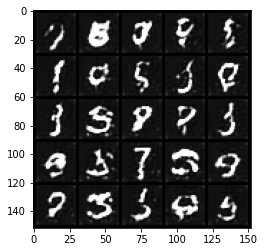

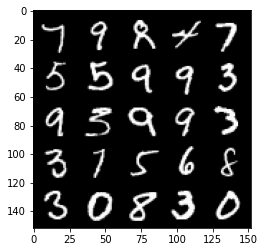

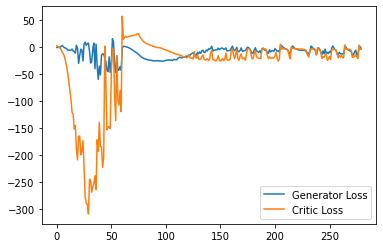

In [ ]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
